In [2]:
from sklearn.metrics import accuracy_score
import numpy as np
import tensorflow as tf
import json
import scipy.io
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import cv2
from scipy.signal import find_peaks

plt.rcParams["figure.figsize"] = 8,8

In [4]:
def binary_mask_from_contour(coords):

    
    width = 500
    height = 500
    
    polygon = [tuple(x) for x in coords]

    img = Image.new('L', (width, height), 0)
    ImageDraw.Draw(img).polygon(polygon, outline=1, fill=1)
    mask = np.array(img)
    return mask

In [5]:
def spike_finder(traces, max_t=0.7, distance=2):
    spikes_all = []
    for trace in traces:
        maximum = np.max(np.array(trace))
        min_height = max_t * maximum
        spikes = find_peaks(x=trace, height=min_height, distance=distance)
        spikes_all.append(spikes[0].tolist())
        
    return spikes_all

In [6]:
def find_contours_from_binary_mask(im):
    
    im = im.astype(int)
    im *= 255 
    im =np.uint8(im)
    _, contours, _= cv2.findContours(im, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours

In [7]:
def get_coords_from_masks(masks):
    contours_all = []

    for i in range(masks.shape[0]):
        mask = masks[i]
        contours = find_contours_from_binary_mask(mask)
        contours_all.append(contours)

    contours_all = np.array(contours_all)
    return contours_all

In [8]:
def apply_two_third_filter(weighted_masks):
    
    binary_masks_two_third = np.zeros(( weighted_masks.shape[0], 500, 500))
    for l in range(weighted_masks.shape[0]):
        if np.max(weighted_masks[l, :, :]) >= 0.5:
            threshold = np.max(weighted_masks[l, :, :]) * 1/3
        for i in range(0, 500):
            for j in range(0, 500):
                value = weighted_masks[l, i, j]
                if value >= threshold:
                    binary_masks_two_third[l, i, j] = 1

    return binary_masks_two_third

In [9]:
def fft_denoiser(x, n_components, to_real=True):
    """Fast fourier transform denoiser.
    
    Denoises data using the fast fourier transform.
    
    Parameters
    ----------
    x : numpy.array
        The data to denoise.
    n_components : int
        The value above which the coefficients will be kept.
    to_real : bool, optional, default: True
        Whether to remove the complex part (True) or not (False)
        
    Returns
    -------
    clean_data : numpy.array
        The denoised data.
        
    References
    ----------
    .. [1] Steve Brunton - Denoising Data with FFT[Python]
       https://www.youtube.com/watch?v=s2K1JfNR7Sc&ab_channel=SteveBrunton
    
    """
    n = len(x)
    
    # compute the fft
    fft = np.fft.fft(x, n)
    
    # compute power spectrum density
    # squared magnitud of each fft coefficient
    PSD = fft * np.conj(fft) / n
    
    # keep high frequencies
    _mask = PSD > n_components
    fft = _mask * fft
    
    # inverse fourier transform
    clean_data = np.fft.ifft(fft)
    
    if to_real:
        clean_data = clean_data.real
    
    return clean_data

# GT - Load JSON from synthetic data

In [10]:
# Opening JSON file
f = open('/home/user/Documents/synthetic_datasets/sequence_10/data.json',)
  
# returns JSON object as 
# a dictionary
data = json.load(f)
coords_synth = data['neuron_coordinates']
events_synth = data['neuron_events']
activities = data['neuron_activities']

# Closing file
f.close()

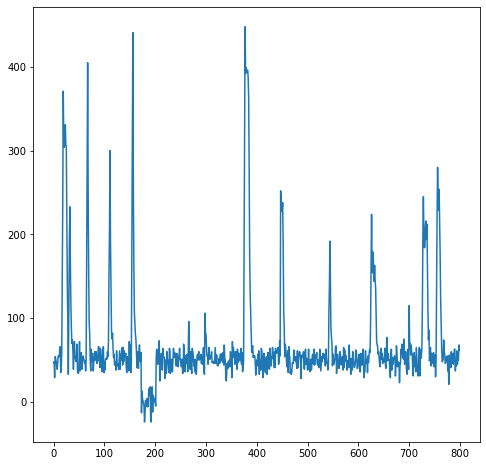

In [11]:
plt.plot(np.arange(0,800), activities[3])

In [12]:
denoised = []
for activity in activities:
    denoised.append(fft_denoiser(activity, n_components=100))

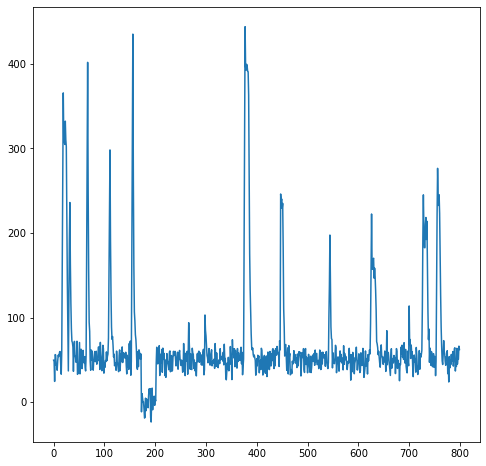

In [13]:
plt.plot(np.arange(0,800), denoised[3])

In [14]:
events_synth[0]

[336,
 515,
 696,
 272,
 649,
 547,
 230,
 446,
 493,
 348,
 678,
 204,
 228,
 563,
 64,
 564,
 734,
 441,
 176,
 279,
 311,
 348,
 765,
 88,
 9,
 416,
 418,
 139,
 45,
 574,
 186,
 659,
 424,
 441,
 611,
 501,
 353,
 773,
 268,
 258,
 745,
 670,
 314,
 593,
 273,
 547,
 335,
 658,
 143,
 232,
 238,
 543,
 679,
 281,
 607,
 650,
 121,
 782,
 745,
 294,
 386,
 156,
 228,
 614,
 375,
 313,
 721,
 658,
 664,
 350,
 753,
 374,
 314,
 329,
 191,
 113,
 486,
 669,
 691,
 321,
 255,
 492,
 240,
 67,
 778,
 22,
 113,
 635,
 157,
 191,
 324,
 501,
 137,
 171,
 414,
 174,
 63,
 452,
 754,
 705,
 582,
 646,
 749,
 590,
 610,
 152,
 771,
 757,
 553,
 70,
 378,
 775,
 624,
 756,
 58,
 8,
 701,
 455,
 152,
 556,
 742,
 581,
 450,
 547,
 511,
 333,
 713,
 576,
 496,
 752,
 109,
 235,
 311,
 562,
 606,
 253,
 783,
 57,
 486,
 206,
 645,
 330,
 798,
 666,
 772,
 281,
 557,
 531,
 142,
 751,
 133,
 731,
 611,
 393,
 607,
 6,
 83,
 574,
 634]

In [16]:
events_gt  = spike_finder(activities, max_t = 0.5, distance=5)

**Generate masks from coords**

In [17]:
masks_synth = []
for coords_single in coords_synth:
    masks_synth.append(binary_mask_from_contour(coords_single))
    
coords_synth_pm = get_coords_from_masks(np.array(masks_synth))

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  if __name__ == '__main__':


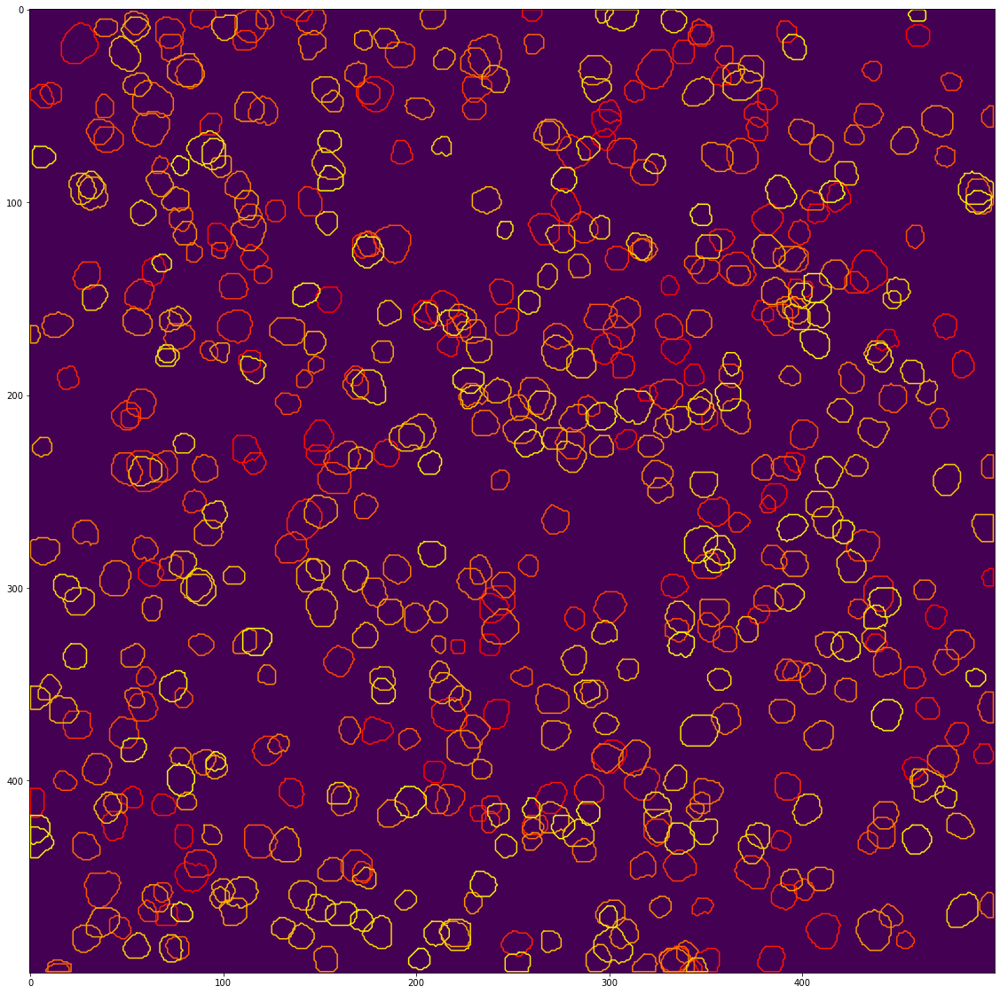

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [18]:
plt.figure(figsize=(20,20))

#implot = plt.imshow(cnmfe_cellmap, cmap="gray")
implot = plt.imshow(np.zeros((500,500)))
coords_all_pca=[]
for i in range(coords_synth_pm.shape[0]):
#     if i != 2:
#         continue
    coord = []
    for j in range(len(coords_synth_pm[i][0])):
        
        y = coords_synth_pm[i][0][j][0][1]
        x = coords_synth_pm[i][0][j][0][0]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c=plt.get_cmap('autumn')(i/coords_synth_pm.shape[0])) 
fig = plt.gcf()    
plt.show()
coords_all_pca = np.array(coords_all_pca)

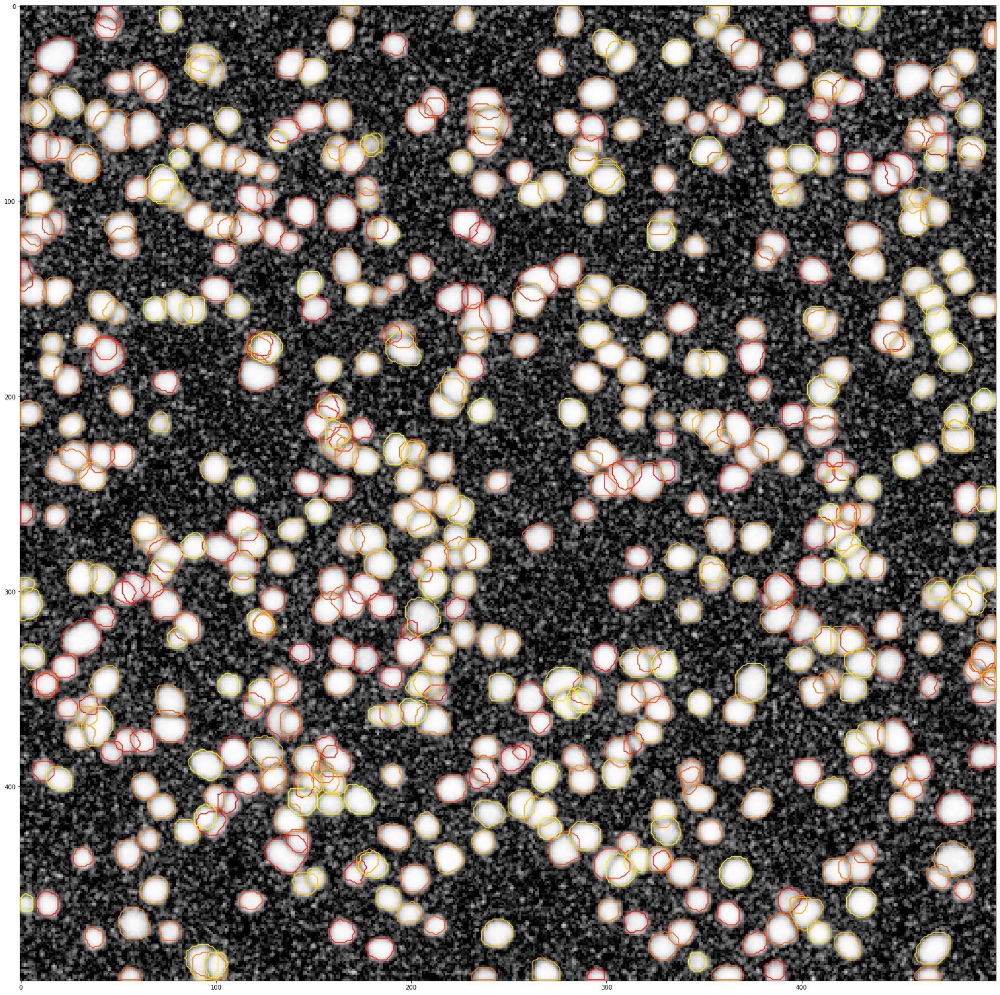

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [118]:
plt.figure(figsize=(30,30))

implot = plt.imshow(cnmfe_cellmap.T, cmap="gray")
coords_all_pca=[]
for i in range(coords_synth_pm.shape[0]):
#     if i != 2:
#         continue
    coord = []
    for j in range(len(coords_synth_pm[i][0])):
        
        y = coords_synth_pm[i][0][j][0][0]
        x = coords_synth_pm[i][0][j][0][1]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c=plt.get_cmap('autumn')(i/coords_synth_pm.shape[0])) 
fig = plt.gcf()    
plt.show()
coords_all_pca = np.array(coords_all_pca)

# Load GUI coord

In [32]:
gui_mat = scipy.io.loadmat('/home/user/Documents/single_session/GUI/synthetic/gui_extracted.mat')
coords_gui = gui_mat["coordinates"][0]
events = gui_mat['events'][0]


#masks = gui_mat['binary_masks']

In [33]:
events_gui = []
for x in events:
    x = x.tolist()
    if not x:
        events_gui.append([])
    else:
        events_gui.append(x[0])

In [34]:
masks_gui = []
masks_gui_for_coord = []
for coord in coords_gui:
    mask = binary_mask_from_contour(coord.tolist())
    masks_gui_for_coord.append(mask)
    masks_gui.append(mask.T.tolist())

check whether some mask is empty and if so which index

In [35]:
i=0
for mask, coord in zip(masks_gui_for_coord, coords_gui):
    
    if not mask.any():
        print(i)
        print(coord)
        
    i += 1

In [36]:
coords_gui_pm = get_coords_from_masks(np.array(masks_gui_for_coord))

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  if __name__ == '__main__':


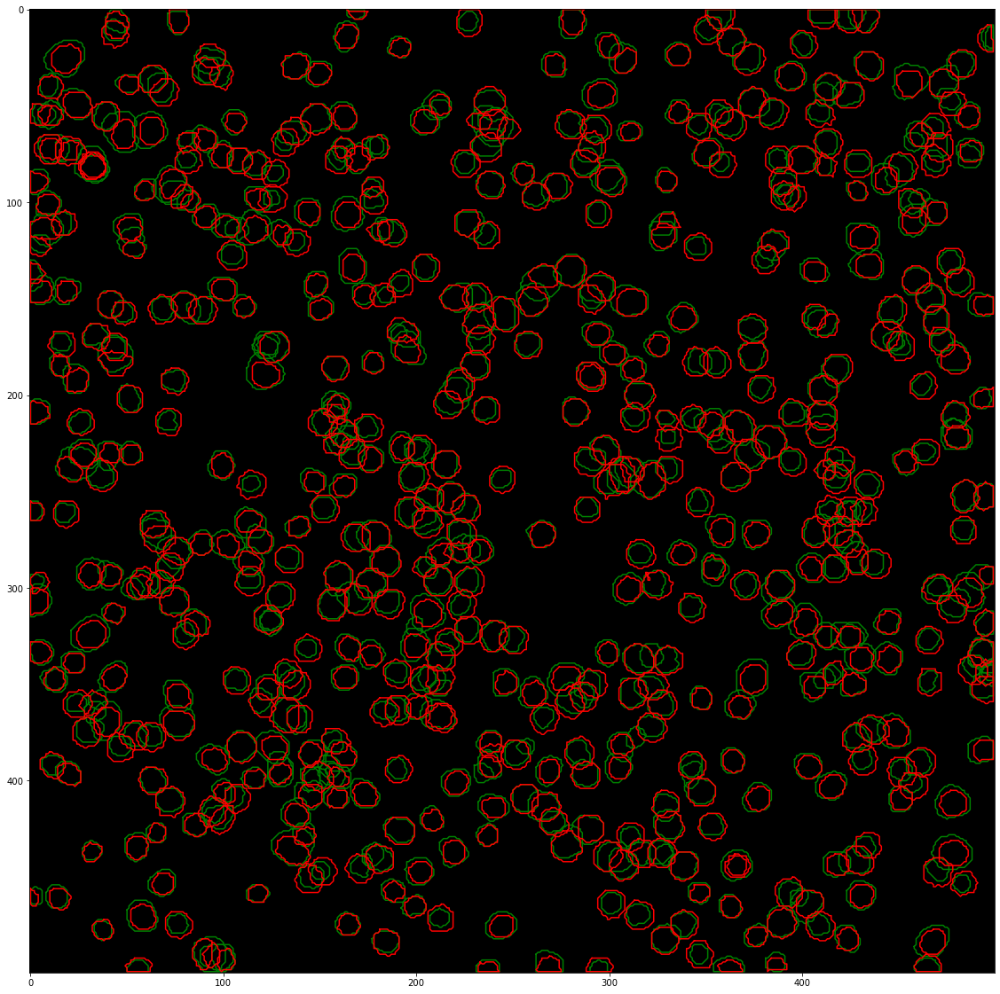

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:36: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [37]:
plt.figure(figsize=(20,20))

##implot = plt.imshow(cnmfe_cellmap.T, cmap="gray")
implot = plt.imshow(np.zeros((500,500)), cmap="gray")
coords_all_pca=[]
for i in range(coords_synth_pm.shape[0]):

    coord = []
    for j in range(len(coords_synth_pm[i][0])):
        
        y = coords_synth_pm[i][0][j][0][0]
        x = coords_synth_pm[i][0][j][0][1]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c="green") 
    
for i in range(coords_gui_pm.shape[0]):
    coord = []
    for j in range(len(coords_gui_pm[i][0])):
        
        y = coords_gui_pm[i][0][j][0][1]
        x = coords_gui_pm[i][0][j][0][0]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c="red") 
fig = plt.gcf()    
plt.show()
coords_all_pca = np.array(coords_all_pca)

# Load Extraction results PCA ICA for synthetic data

In [103]:
mat_pca_ica_synth = scipy.io.loadmat('/home/user/Documents/synthetic_datasets/sequence_10/extracted/resultsPCAICA/resultsPCAICA.mat')
cell_map_mat =  scipy.io.loadmat('/home/user/Documents/synthetic_datasets/sequence_10/extracted/resultsPCAICA/cellMap.mat')
filters_binary_mat = scipy.io.loadmat("/home/user/Documents/synthetic_datasets/sequence_10/extracted/filters_binary.mat")

In [104]:
traces_pca_ica = mat_pca_ica_synth["traces"]
masks_pca_ica = filters_binary_mat['filtersBinary'].T
cell_map = cell_map_mat['cellMap'].T
coords_pca_ica = get_coords_from_masks(np.array(masks_pca_ica))
spikes_pca_ica = spike_finder(traces_pca_ica, 0.7)

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  if __name__ == '__main__':


**visualize spike_finder**

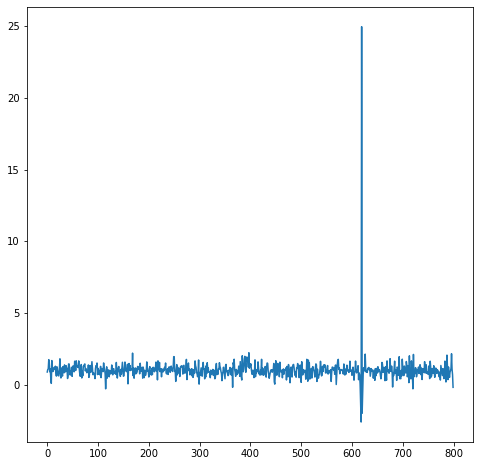

[619]


In [45]:

plt.plot(np.arange(800), traces_pca_ica[3])
plt.show()


print(spikes_pca_ica[3])

# Visualize PCA ICA results

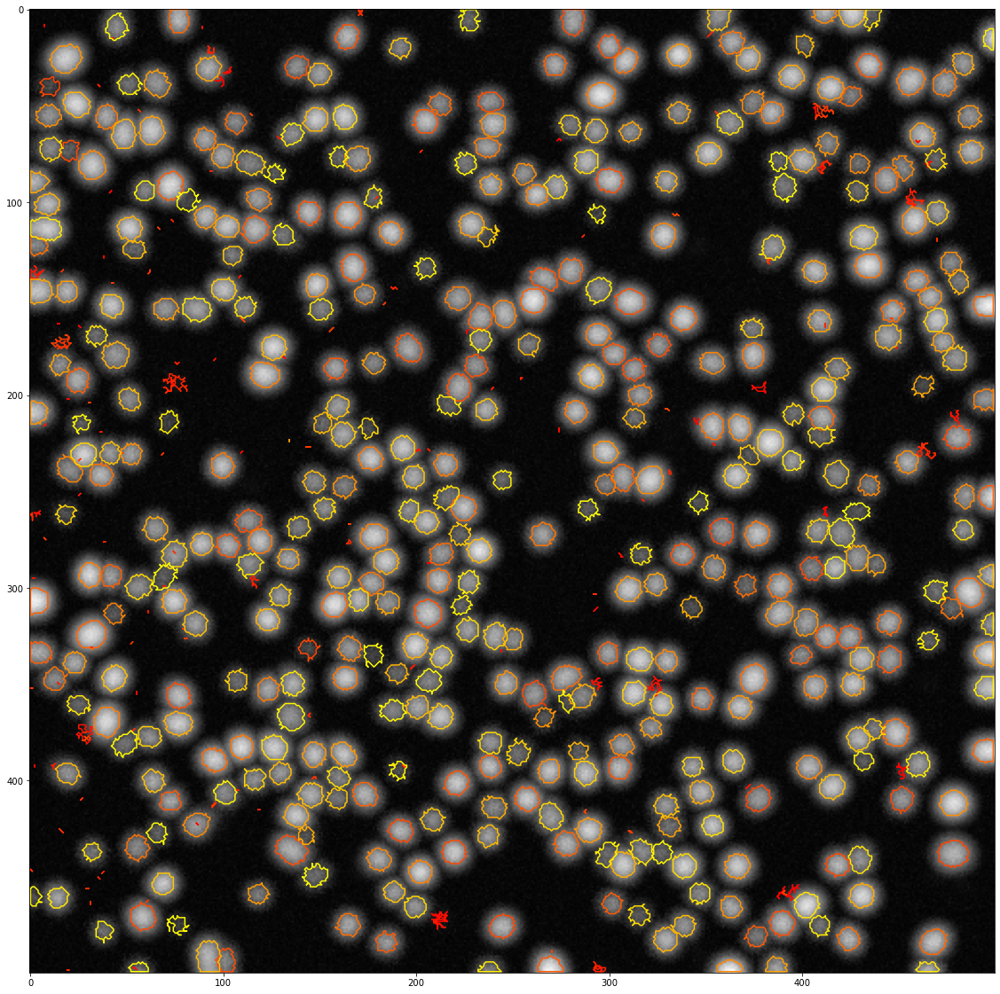

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [91]:
plt.figure(figsize=(20,20))

implot = plt.imshow(cell_map.T, cmap="gray")
coords_all_pca=[]
for i in range(coords_pca_ica.shape[0]):
#     if i != 2:
#         continue
    coord = []
    for j in range(len(coords_pca_ica[i][0])):
        
        y = coords_pca_ica[i][0][j][0][0]
        x = coords_pca_ica[i][0][j][0][1]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c=plt.get_cmap('autumn')(i/coords_pca_ica.shape[0])) 
fig = plt.gcf()    
plt.show()
coords_all_pca = np.array(coords_all_pca)


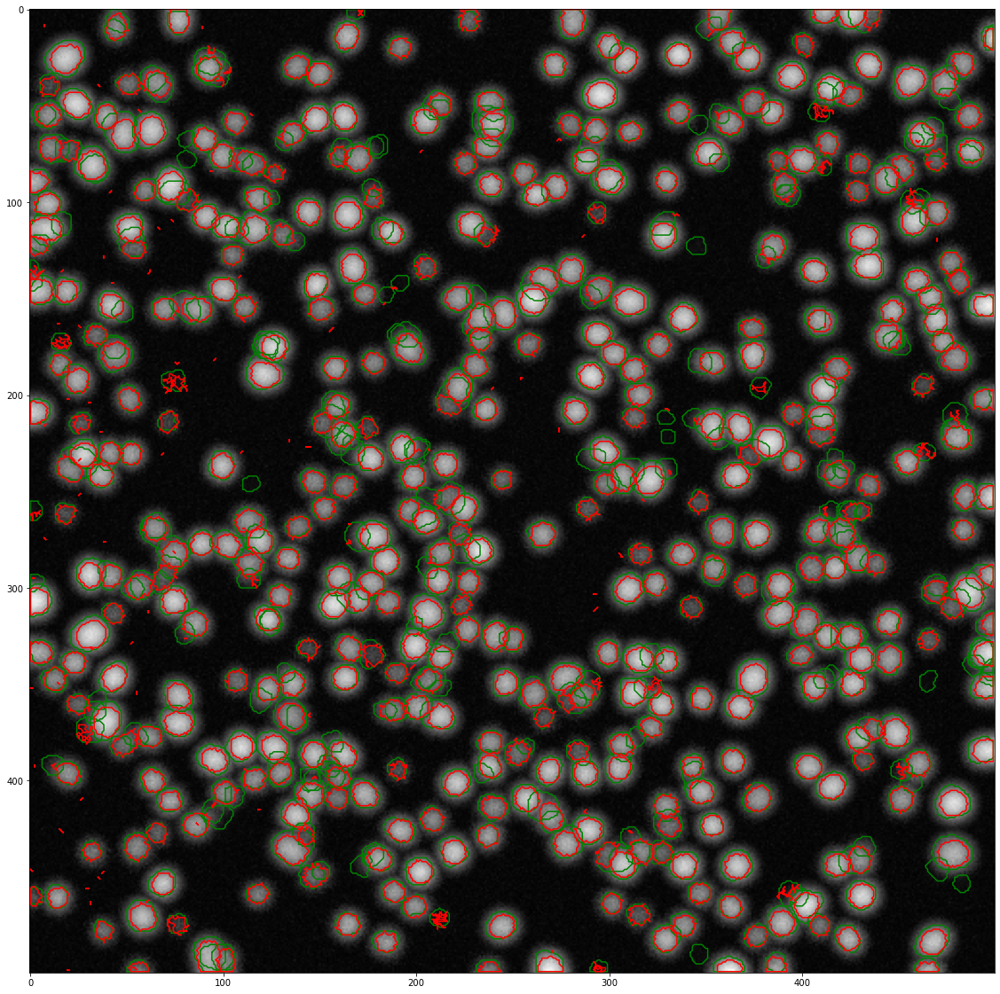

In [92]:
plt.figure(figsize=(20,20))

implot = plt.imshow(cell_map.T, cmap="gray")
coords_all_pca=[]
for i in range(coords_synth_pm.shape[0]):

    coord = []
    for j in range(len(coords_synth_pm[i][0])):
        
        y = coords_synth_pm[i][0][j][0][0]
        x = coords_synth_pm[i][0][j][0][1]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c="green") 

coords_all_pca=[]
for i in range(coords_pca_ica.shape[0]):
#     if i != 2:
#         continue
    coord = []
    for j in range(len(coords_pca_ica[i][0])):
        
        y = coords_pca_ica[i][0][j][0][0]
        x = coords_pca_ica[i][0][j][0][1]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c="red")

fig = plt.gcf()    
plt.show()


# GT on top of PCA-ICA extracted Cell Map

In [9]:
plt.figure(figsize=(20,20))

implot = plt.imshow(cell_map, cmap="gray")
coords_all_pca=[]
for i in range(coords_synth_pm.shape[0]):
#     if i != 9:
#         continue
    coord = []
    for j in range(len(coords_synth_pm[i][0])):
        
        y = coords_synth_pm[i][0][j][0][1]
        x = coords_synth_pm[i][0][j][0][0]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c=plt.get_cmap('autumn')(i/coords_synth_pm.shape[0])) 
    #break
fig = plt.gcf()    
plt.show()
coords_all_pca = np.array(coords_all_pca)


NameError: name 'cell_map' is not defined

<Figure size 1440x1440 with 0 Axes>

# Load CNMF-E

In [61]:
# traces_cnmfe = scipy.io.loadmat('/home/user/Documents/synthetic_datasets/sequence_9/extracted/resultsCNMFE/synthetic_cnmfe/traces_synthetic.mat')
# cell_map_cnmfe =  scipy.io.loadmat('/home/user/Documents/synthetic_datasets/sequence_9/extracted/resultsCNMFE/synthetic_cnmfe/cellmap_synthetic.mat')
# filters_binary_cnmfe = scipy.io.loadmat("/home/user/Documents/synthetic_datasets/sequence_9/extracted/resultsCNMFE/synthetic_cnmfe/binary_masks_synthetic.mat")
# coords_cnmfe = scipy.io.loadmat("/home/user/Documents/synthetic_datasets/sequence_9/extracted/resultsCNMFE/synthetic_cnmfe/coords_synthetic.mat")

In [106]:
traces_cnmfe = scipy.io.loadmat('/home/user/Documents/synthetic_datasets/sequence_10/extracted/resultsCNMFE/traces_synthetic.mat')
cell_map_cnmfe =  scipy.io.loadmat('/home/user/Documents/synthetic_datasets/sequence_10/extracted/resultsCNMFE/cellmap_synthetic.mat')
filters_binary_cnmfe = scipy.io.loadmat("/home/user/Documents/synthetic_datasets/sequence_10/extracted/resultsCNMFE/binary_masks_synthetic.mat")
coords_cnmfe = scipy.io.loadmat("/home/user/Documents/synthetic_datasets/sequence_10/extracted/resultsCNMFE/coords_synthetic.mat")

In [107]:
cnmfe_traces = traces_cnmfe['C']
cnmfe_cellmap = cell_map_cnmfe['cellmap'].T
cnmfe_masks = filters_binary_cnmfe['A'].T
print(cnmfe_masks.shape)
cnmfe_masks_two_third = apply_two_third_filter(cnmfe_masks)
print(cnmfe_masks_two_third.shape)
#cnmfe_masks = [mask.T for mask in cnmfe_masks_two_third]
cnmfe_coords = coords_cnmfe['coords']

(776, 500, 500)
(776, 500, 500)


In [108]:
cnmfe_masks = [mask.tolist() for mask in cnmfe_masks_two_third]

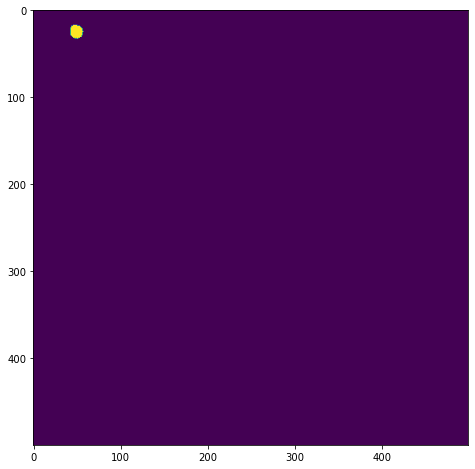

In [33]:
plt.imshow(cnmfe_masks_two_third[0])

In [95]:
cnmfe_coords = get_coords_from_masks(np.array(cnmfe_masks_two_third))

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  if __name__ == '__main__':


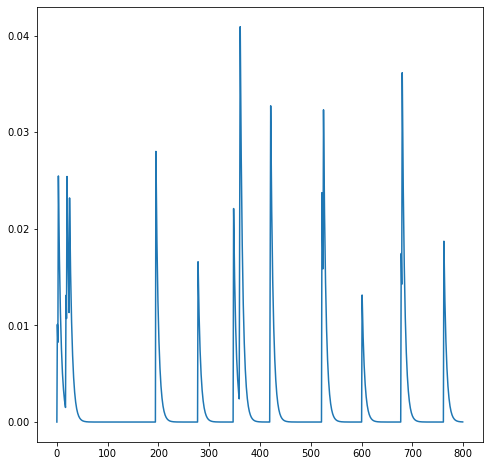

[1, 3, 18, 20, 25, 195, 278, 348, 361, 421, 522, 525, 601, 678, 680, 762]


In [16]:
spikes_cnmfe = spike_finder(cnmfe_traces,  max_t=0.1)
plt.plot(np.arange(800), cnmfe_traces[3])
plt.show()

print(spikes_cnmfe[3])

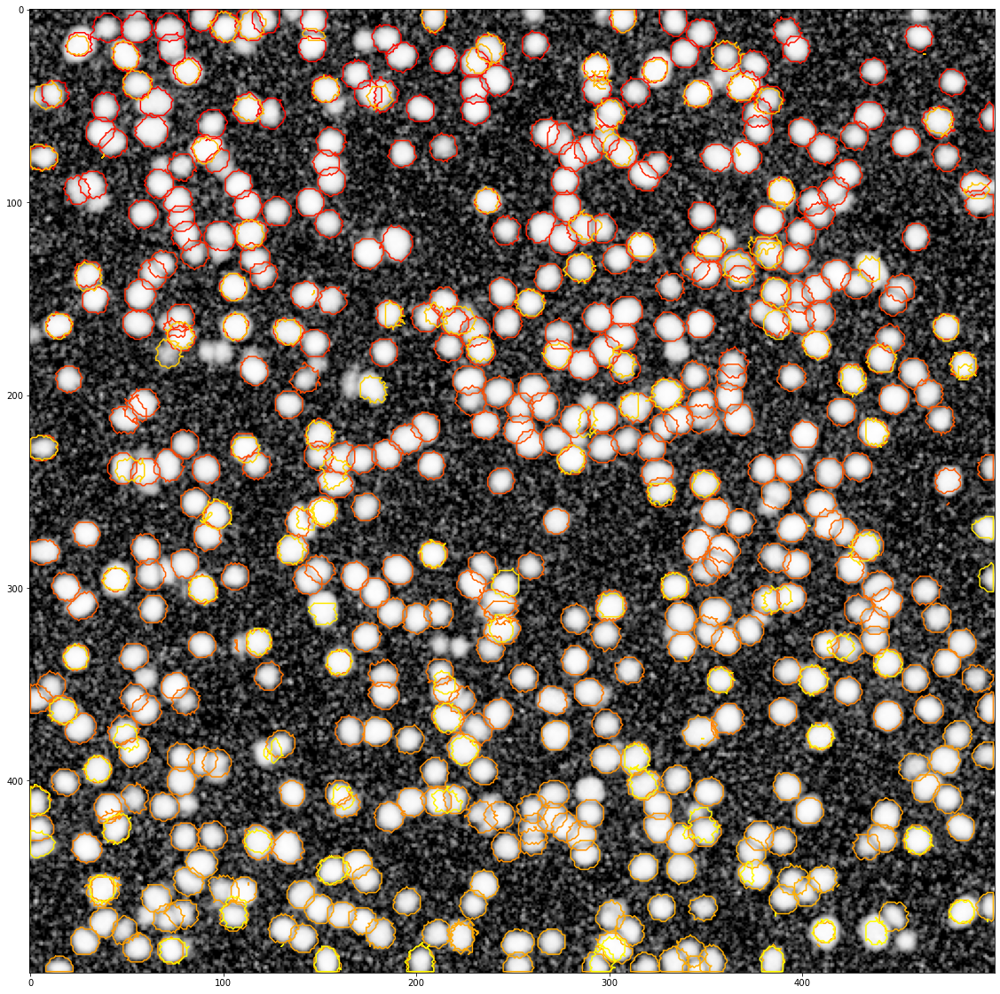

/home/user/anaconda3/envs/hdf5/lib/python3.7/site-packages/ipykernel_launcher.py:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [96]:
plt.figure(figsize=(20,20))

implot = plt.imshow(cnmfe_cellmap, cmap="gray")
coords_all_cnmfe=[]
for i in range(cnmfe_coords.shape[0]):
#     if i != 2:
#         continue
    coord = []
    for j in range(len(cnmfe_coords[i][0])):
        
        y = cnmfe_coords[i][0][j][0][1]
        x = cnmfe_coords[i][0][j][0][0]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_cnmfe.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c=plt.get_cmap('autumn')(i/cnmfe_coords.shape[0])) 
fig = plt.gcf()    
plt.show()
coords_all_cnmfe = np.array(coords_all_cnmfe)

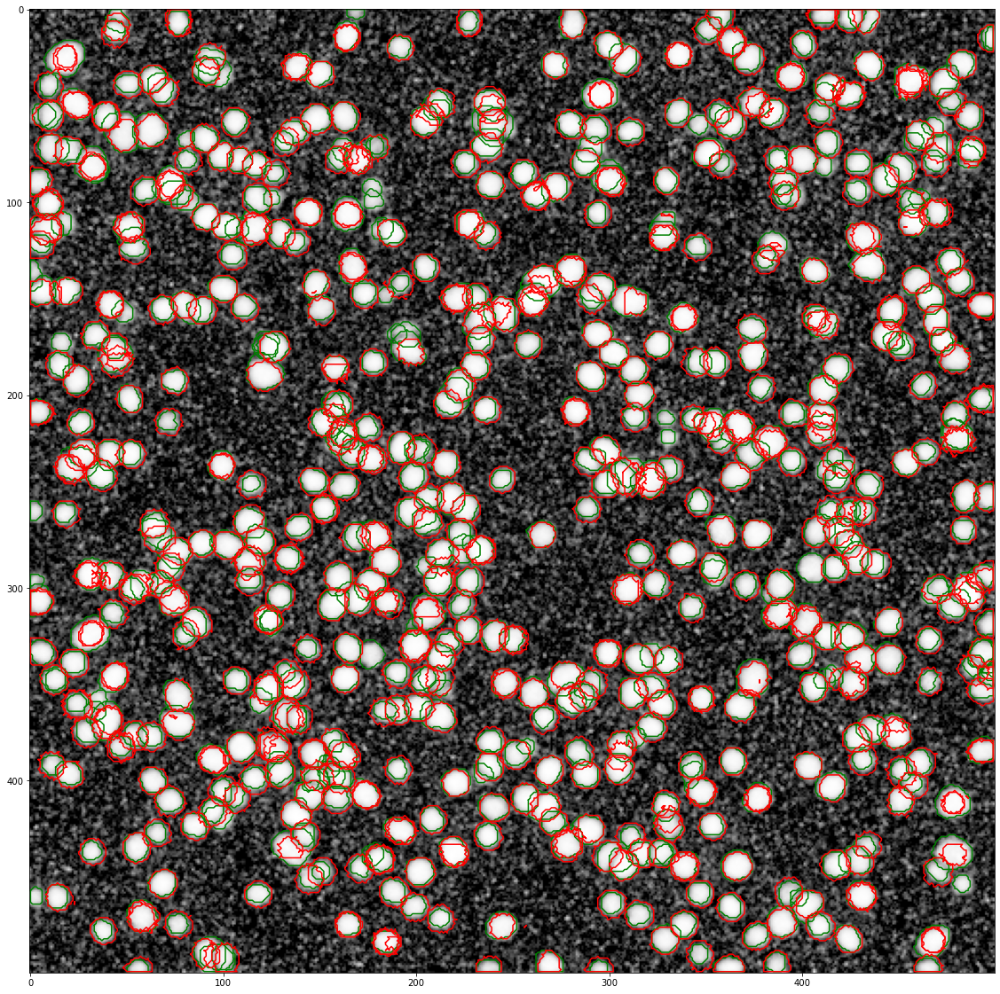

In [97]:
plt.figure(figsize=(20,20))

implot = plt.imshow(cnmfe_cellmap.T, cmap="gray")
coords_all_pca=[]
for i in range(coords_synth_pm.shape[0]):

    coord = []
    for j in range(len(coords_synth_pm[i][0])):
        
        y = coords_synth_pm[i][0][j][0][0]
        x = coords_synth_pm[i][0][j][0][1]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c="green") 

coords_all_pca=[]
for i in range(cnmfe_coords.shape[0]):
#     if i != 2:
#         continue
    coord = []
    for j in range(len(cnmfe_coords[i][0])):
        
        y = cnmfe_coords[i][0][j][0][0]
        x = cnmfe_coords[i][0][j][0][1]
        coord.append([x,y])
        
    coord.append(coord[0])
    coords_all_pca.append(coord)
    
    xs, ys = zip(*coord)
    plt.plot(xs,ys, c="red")

fig = plt.gcf()    
plt.show()


# Metrics

In [29]:
def iou(mask1, mask2):
    i = len(np.intersect1d(np.squeeze(np.argwhere(np.ravel(mask1))), np.squeeze(np.argwhere(np.ravel(mask2)))))
    u = len(np.union1d(np.squeeze(np.argwhere(np.ravel(mask1))), np.squeeze(np.argwhere(np.ravel(mask2)))))
    return i/u



In [30]:
def get_accuracy_spikes(spikes_gt, spikes_pred, threshhold=5):

    fn = 0
    tp = 0
    fp = 0
    print(spikes_gt, spikes_pred)
    for  gt in spikes_gt:
        pred_cand = []
        dist_cand = []
        for p in (spikes_pred):
            if (np.abs(p - gt) < threshhold):
                pred_cand.append(p)
                dist_cand.append(np.abs(p - gt))

        if len(pred_cand) == 0:
            fn += 1
        else:
            index = np.argmin(dist_cand)
            pred = pred_cand[index]
        
            del spikes_pred[spikes_pred.index(pred)]
            tp += 1

    fp = len(spikes_pred) 

    f1_score = tp / (tp + 1/2 * (fp + fn))
  
    return f1_score, tp, fp, fn

In [38]:
def get_accuracy(masks_gt, events_gt, masks_pred, events_pred, threshhold_iou=0.5, threshhold_events=5):
    fn = 0
    tp = 0
    
    
    f1_score_traces = 0
    tp_t = 0
    fp_t = 0
    fn_t = 0
    mean_iou = 0
    nb_neurons = len(masks_gt)
    for j, (mask_gt, event_gt) in enumerate(zip(masks_gt, events_gt)):
        print(f"Processing neuron {j} of {nb_neurons}")
        mask_cand = None
        iou_score_cand = None
        event_cand = None
        i = 0
        index = None

        for mask_pred, event_pred in zip(masks_pred, events_pred):
            iou_score = iou(mask_gt, np.array(mask_pred))

            if iou_score > threshhold_iou:

                if mask_cand is not None and iou_score > iou_score_cand:
                    print("Found a better one!")
                    mask_cand = mask_pred
                    event_cand = event_pred
                    iou_score_cand = iou_score
                    index = i

                if mask_cand is not None and iou_score <= iou_score_cand:
                    continue

                else:
                    print("Found one!")
                    mask_cand = mask_pred
                    event_cand = event_pred
                    iou_score_cand = iou_score
                    index = i

            i += 1

        if mask_cand is None:
            print("Nope")
            fn += 1
        else:
            tp += 1
            mean_iou += iou_score_cand
            
            f1_score_spikes, tp_s, fp_s, fn_s = get_accuracy_spikes(event_gt, event_cand, threshhold_events)
            f1_score_traces += f1_score_spikes
            tp_t += tp_s
            fp_t += fp_s
            fn_t += fn_s
            
            del masks_pred[index]
            del events_pred[index]

    fp = len(masks_pred)
    f1_score_roi = tp / (tp + 1 / 2 * (fp + fn))
    mean_iou_all = mean_iou / nb_neurons
    mean_iou_detected = mean_iou / tp
    f1_score_traces /= tp
    
    print("\n\nRESULTS:\n\nROI scores: \n")
    print(f"ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of {threshhold_iou}):\n{f1_score_roi}")
    print("\nResulting from:")
    print(f"True Positive: {tp}")
    print(f"False Positive: {fp}")
    print(f"False Negative: {fn}")
    print(f"\nMean IntersectionOverUnion for all neurons (undetected or detected): {mean_iou_all}")
    print(f"Mean IntersectionOverUnion for all detected neurons: {mean_iou_detected}")
    
    print("\nEvent scores: \n")
    print("Events in Calcium Trace for every correctly detected neuron ROI")
    print(f"Correctly labeled at a threshold of +/- {threshhold_events}")
    print(f"Event F1-Score: {f1_score_traces}")
    print("\nResulting from:")
    print(f"Total True Positive: {tp_t}")
    print(f"Total False Positive: {fp_t}")
    print(f"Total False Negative: {fn_t}")

    return mean_iou_all, mean_iou_detected, f1_score_roi, f1_score_traces

#iou_mean, iou_mean_det, f1_score_roi, f1_score_traces = get_accuracy(masks_synth, events_gt, cnmfe_masks, spikes_cnmfe)
iou_mean, iou_mean_det, f1_score_roi, f1_score_traces = get_accuracy(masks_synth, events_gt, masks_gui, events_gui)
#iou_mean, iou_mean_det, f1_score_roi, f1_score_traces = get_accuracy(masks_synth, events_gt, masks_pca_ica.tolist(), spikes_pca_ica)
#iou_mean, iou_mean_det, f1_score_roi, f1_score_traces = get_accuracy([mask_1, mask_3, mask_2], [[1, 4, 6], [3, 5, 7],[2,0,1]], [mask_1, mask_1, mask_2], [[1, 5, 6], [1, 5, 7], [2, 0, 1]])

Processing neuron 0 of 600
Found one!
[5, 10, 82, 89, 132, 139, 280, 392, 399, 449, 530, 638, 712, 730] [5, 82, 85, 132, 136, 279, 328, 392, 448, 529, 636, 711, 729]
Processing neuron 1 of 600
Found one!
[7, 12, 27, 47, 302, 308, 314, 379, 445, 467, 473, 618, 623, 692, 713] [7, 11, 26, 46, 158, 301, 308, 313, 378, 443, 445, 467, 618, 621, 691, 700, 712]
Processing neuron 2 of 600
Found one!
[8, 111, 143, 161, 167, 282, 430, 543, 618, 710, 793] [7, 110, 142, 146, 161, 167, 280, 428, 430, 542, 617, 710, 793, 797]
Processing neuron 3 of 600
Found one!
[19, 32, 67, 111, 156, 377, 382, 447, 626, 728, 756] [19, 23, 66, 91, 110, 155, 205, 264, 331, 377, 380, 382, 447, 542, 625, 727, 732, 756, 798]
Processing neuron 4 of 600
Found one!
[33, 109, 116, 187, 192, 216, 425, 432, 444, 450, 508, 533, 598, 603, 702, 707, 731] [187, 216, 444, 533, 702]
Processing neuron 5 of 600
Found one!
[4, 10, 44, 54, 100, 219, 329, 435, 489, 658, 663, 670, 686, 693, 746] [3, 43, 53, 99, 218, 327, 394, 434, 489, 6

Nope
Processing neuron 60 of 600
Found one!
[3, 8, 26, 32, 90, 95, 161, 166, 180, 185, 233, 280, 287, 323, 437, 455, 644, 650, 656] [3, 25, 90, 93, 160, 180, 232, 280, 322, 436, 453, 643, 648]
Processing neuron 61 of 600
Found one!
[45, 68, 283, 297, 330, 337, 386, 492, 521, 618, 679] [373]
Processing neuron 62 of 600
Found one!
[7, 20, 26, 121, 133, 196, 289, 383, 400, 459, 537, 566, 734, 742, 790, 795] [20, 25, 120, 132, 196, 288, 380, 399, 428, 457, 459, 536, 565, 732, 742, 789, 793, 797]
Processing neuron 63 of 600
Found one!
[3, 14, 24, 29, 81, 110, 188, 201, 207, 240, 360, 548] [2, 22, 24, 80, 110, 188, 201, 204, 239, 359, 546, 548, 695, 759, 761, 767]
Processing neuron 64 of 600
Found one!
[17, 27, 32, 178, 220, 245, 278, 283, 477, 553, 574, 601, 607, 698, 703, 774] [17, 90, 92, 96, 178, 251, 278, 283, 774]
Processing neuron 65 of 600
Found one!
[7, 15, 37, 42, 122, 132, 189, 194, 257, 315, 389, 407, 568, 573, 585, 592, 625, 717, 779] [7, 189, 194, 315]
Processing neuron 66 of 6

Found one!
[5, 39, 60, 80, 182, 246, 300, 406, 453, 460, 467, 474, 502, 509, 737, 773] [197, 595, 672, 675]
Processing neuron 119 of 600
Nope
Processing neuron 120 of 600
Found one!
[8, 17, 23, 217, 290, 444, 489, 494, 579, 711, 746, 779] [8, 290, 444, 489, 579, 585, 746]
Processing neuron 121 of 600
Found one!
[5, 22, 28, 90, 175, 213, 226, 231, 236, 241, 257, 330, 358, 363, 457, 539, 678, 704] [22, 26, 90, 212, 224, 228, 236, 256, 329, 358, 456, 537, 677, 703]
Processing neuron 122 of 600
Found one!
[7, 12, 23, 30, 35, 79, 301, 454, 530, 535, 743, 785] [11, 22, 28, 30, 35, 78, 300, 454, 530, 533, 741, 748, 785]
Processing neuron 123 of 600
Found one!
[5, 14, 46, 126, 160, 260, 378, 384, 390, 433, 544, 646, 658, 757, 782] [47, 60, 125, 160, 502]
Processing neuron 124 of 600
Found one!
[25, 31, 51, 144, 356, 482, 491, 605, 657, 795] [71]
Processing neuron 125 of 600
Found one!
[13, 20, 75, 244, 332, 350, 509, 516, 523, 649, 656, 739, 750, 755] [17, 22, 114, 125, 128, 135, 226, 257, 331

Found one!
[6, 24, 31, 156, 290, 295, 417, 458, 468, 586, 654, 777, 783] [24, 28, 155, 290, 293, 417, 457, 467, 585, 653, 658, 663, 777, 782]
Processing neuron 180 of 600
Found one!
[10, 17, 37, 43, 51, 69, 74, 152, 158, 310, 369, 458, 465, 571, 579, 595, 669, 690, 697, 720] [9, 37, 151, 368, 457, 571, 690]
Processing neuron 181 of 600
Found one!
[14, 26, 39, 46, 111, 178, 184, 293, 300, 428, 433, 472, 512, 517, 594, 665] [111, 178, 293, 472, 665]
Processing neuron 182 of 600
Found one!
[4, 10, 18, 105, 110, 199, 221, 227, 304, 375, 411, 536, 636, 699, 704, 747] [66, 178, 362, 541]
Processing neuron 183 of 600
Found one!
[7, 137, 241, 286, 361, 372, 377, 499, 504, 509, 626, 679, 754, 771, 797] [237]
Processing neuron 184 of 600
Nope
Processing neuron 185 of 600
Found one!
[5, 10, 24, 32, 74, 133, 178, 208, 215, 382, 550, 626, 634, 643, 719, 782, 795] [5, 9, 24, 32, 74, 133, 178, 181, 208, 212, 214, 240, 382, 626, 634, 636, 638, 643, 683, 753, 758, 782, 795, 797]
Processing neuron 186 o

Found one!
[6, 35, 41, 61, 161, 187, 192, 199, 213, 380, 387, 476, 483, 557, 567, 654, 770, 779] [187, 213, 476, 480, 483, 567, 770, 779]
Processing neuron 241 of 600
Found one!
[4, 9, 126, 188, 193, 251, 258, 372, 417, 423, 557, 591, 597, 656, 738] [4, 126, 188, 250, 255, 371, 417, 555, 591, 597, 654]
Processing neuron 242 of 600
Found one!
[6, 13, 31, 36, 59, 134, 140, 165, 250, 257, 485, 491, 592, 636, 643, 709, 714] [172, 176, 596, 625, 755, 772]
Processing neuron 243 of 600
Found one!
[6, 35, 40, 109, 254, 298, 313, 318, 365, 372, 453, 459, 480, 515, 555, 561] [6, 13, 115, 118, 466, 470, 545, 550, 600, 605, 678, 785]
Processing neuron 244 of 600
Found one!
[4, 136, 142, 267, 272, 316, 323, 432, 439, 591, 660, 717] [2, 4, 99, 136, 200, 267, 316, 323, 432, 453, 590, 650, 660, 716]
Processing neuron 245 of 600
Nope
Processing neuron 246 of 600
Found one!
[9, 24, 30, 91, 238, 244, 261, 290, 417, 422, 678, 683, 689, 697, 704] [3, 120, 262, 403, 493, 583, 604, 608, 781]
Processing neuro

Nope
Processing neuron 298 of 600
Found one!
[4, 17, 90, 126, 131, 148, 218, 232, 239, 246, 340, 438, 532, 573, 621, 626, 738] [4, 16, 90, 126, 147, 217, 231, 239, 243, 339, 365, 437, 528, 573, 576, 621, 738]
Processing neuron 299 of 600
Found one!
[6, 26, 36, 87, 127, 205, 254, 267, 454, 544, 615, 621, 698] [25, 36, 86, 127, 204, 254, 267, 454, 543, 613, 615, 697]
Processing neuron 300 of 600
Found one!
[4, 9, 23, 94, 233, 271, 354, 434, 443, 528, 610] [4, 6, 22, 93, 231, 233, 270, 352, 354, 433, 442, 528, 531, 609]
Processing neuron 301 of 600
Found one!
[6, 11, 21, 208, 214, 224, 393, 401, 407, 489, 496, 529, 647, 654, 678, 754] [7, 48, 71, 74, 76, 108, 111, 159, 386, 433, 462, 754]
Processing neuron 302 of 600
Found one!
[4, 11, 16, 129, 139, 161, 187, 293, 299, 306, 371, 493, 557, 630, 643, 650, 743] [3, 10, 16, 129, 139, 160, 187, 292, 299, 306, 370, 488, 492, 556, 630, 642, 717, 743]
Processing neuron 303 of 600
Nope
Processing neuron 304 of 600
Found one!
[6, 11, 176, 264, 286,

Found one!
[8, 20, 32, 37, 112, 118, 270, 275, 455, 494, 512, 519, 576, 653, 765, 770] [7, 19, 32, 112, 245, 270, 378, 455, 494, 512, 575, 648, 652, 765]
Processing neuron 354 of 600
Found one!
[11, 30, 42, 208, 214, 401, 456, 516, 565, 623, 655, 662, 687, 746] [9, 41, 173, 208, 400, 456, 516, 565, 623, 655, 687, 745]
Processing neuron 355 of 600
Found one!
[15, 100, 228, 422, 441, 448, 645, 697] [9, 14, 55, 99, 204, 228, 288, 313, 421, 441, 446, 476, 645, 697, 708]
Processing neuron 356 of 600
Found one!
[9, 28, 35, 48, 54, 81, 91, 133, 138, 212, 220, 301, 382, 411, 519, 581, 591, 611, 676, 780] [34, 43, 48, 79, 81, 91, 132, 137, 210, 212, 220, 300, 382, 386, 411, 518, 581, 590, 609, 673, 779]
Processing neuron 357 of 600
Found one!
[5, 10, 15, 61, 325, 429, 470, 527, 562, 568, 644, 649, 794] [61, 527, 531, 562, 568, 570, 644, 794]
Processing neuron 358 of 600
Found one!
[4, 18, 34, 88, 196, 422, 798] [656]
Processing neuron 359 of 600
Found one!
[18, 80, 117, 201, 214, 289, 394, 459,

Found one!
[168, 177, 197, 203, 210, 297, 407, 412, 419, 482, 520, 578, 653, 727, 732] [116, 166, 176, 196, 203, 297, 406, 412, 481, 518, 520, 576, 653, 727]
Processing neuron 412 of 600
Found one!
[8, 47, 102, 108, 159, 270, 318, 373, 385, 447, 452, 539, 548, 692, 733, 793] [28, 117, 718, 774]
Processing neuron 413 of 600
Found one!
[6, 31, 174, 186, 191, 244, 324, 435, 451, 462, 542, 548, 554, 682, 780, 787] [8, 51, 54, 59, 64, 553, 567, 607, 630, 751]
Processing neuron 414 of 600
Found one!
[15, 21, 128, 133, 416, 472, 506, 524, 530, 666, 672, 717, 722, 731] [9, 15, 127, 133, 414, 471, 506, 524, 661, 666, 717, 726]
Processing neuron 415 of 600
Found one!
[5, 17, 98, 138, 212, 302, 318, 323, 433, 441, 563, 620, 685] [5, 17, 20, 97, 138, 142, 211, 300, 302, 317, 432, 441, 562, 620, 683]
Processing neuron 416 of 600
Found one!
[11, 81, 215, 220, 351, 357, 510, 515, 593, 667, 674, 759] [7, 10, 27, 77, 80, 197, 214, 294, 347, 351, 353, 510, 591, 666, 673, 681, 700, 758, 781]
Processing n

Found one!
[7, 29, 98, 123, 151, 504, 576, 623, 645, 651] [4, 202, 386, 395, 402, 682]
Processing neuron 463 of 600
Found one!
[8, 104, 121, 164, 175, 222, 270, 474, 482, 494, 592, 672, 755] [8, 104, 121, 125, 162, 174, 222, 269, 473, 478, 494, 535, 591, 670, 672, 754]
Processing neuron 464 of 600
Nope
Processing neuron 465 of 600
Found one!
[6, 37, 43, 59, 146, 151, 156, 166, 284, 291, 347, 506, 562, 569, 578] [5, 36, 58, 145, 151, 166, 189, 284, 346, 375, 506, 562, 573]
Processing neuron 466 of 600
Found one!
[17, 30, 37, 139, 203, 254, 449, 454, 480, 560, 567, 634, 729] [17, 139, 634]
Processing neuron 467 of 600
Found one!
[16, 36, 107, 208, 292, 350, 357, 375, 533, 628, 771] [16, 35, 105, 208, 292, 294, 350, 353, 374, 379, 532, 628, 631, 770]
Processing neuron 468 of 600
Found one!
[3, 26, 31, 49, 280, 353, 361, 493, 500, 515, 535, 737] [2, 25, 49, 279, 353, 493, 496, 515, 534, 696, 737, 739]
Processing neuron 469 of 600
Found one!
[3, 8, 25, 199, 270, 417, 430, 436, 494, 500, 519

Found one!
[9, 48, 169, 175, 321, 327, 362, 368, 393, 605, 734, 740, 774, 779] [9, 47, 169, 172, 321, 325, 362, 365, 392, 604, 652, 734, 774]
Processing neuron 523 of 600
Found one!
[3, 20, 50, 254, 337, 431, 448, 571, 653, 663, 668, 787] [540]
Processing neuron 524 of 600
Found one!
[13, 26, 78, 199, 216, 292, 550, 556, 712, 763, 769] [10, 13, 19, 22, 24, 26, 70, 99, 101, 104, 181, 186, 188, 295, 297, 334, 502, 526, 553, 597, 712, 738, 743, 763, 767, 769]
Processing neuron 525 of 600
Found one!
[8, 18, 31, 60, 117, 209, 259, 382, 407, 470, 503, 609, 657] [390]
Processing neuron 526 of 600
Found one!
[3, 10, 15, 33, 39, 51, 87, 141, 146, 152, 281, 415, 420, 520, 555, 711, 784] [7, 32, 85, 141, 152, 279, 415, 518, 520, 539, 711, 783]
Processing neuron 527 of 600
Found one!
[10, 167, 172, 180, 413, 446, 461, 574, 585, 593, 609, 620, 670, 725, 789, 795] [9, 167, 175, 180, 412, 444, 460, 574, 584, 589, 608, 620, 669, 724, 789]
Processing neuron 528 of 600
Found one!
[3, 11, 145, 151, 218, 

[8, 14, 135, 197, 244, 375, 537, 579, 733, 739, 768] [135, 197, 537, 739, 768]
Processing neuron 580 of 600
Nope
Processing neuron 581 of 600
Found one!
[13, 19, 41, 46, 64, 142, 152, 202, 468, 479, 489, 495, 507, 525, 598, 695, 766, 772, 789, 795] [13, 16, 40, 63, 76, 141, 151, 201, 467, 478, 489, 506, 524, 572, 597, 694, 766, 769, 789, 792, 795]
Processing neuron 582 of 600
Found one!
[19, 24, 29, 98, 110, 142, 270, 322, 415, 445, 488, 570, 577, 643, 732, 737] [19, 28, 98, 109, 141, 269, 322, 413, 444, 488, 492, 570, 574, 642, 732, 735]
Processing neuron 583 of 600
Found one!
[16, 46, 80, 86, 253, 415, 421, 527, 612, 623, 732] [18, 34, 196, 798]
Processing neuron 584 of 600
Found one!
[14, 26, 126, 213, 284, 443, 450, 497, 512, 519, 629, 651] [13, 25, 126, 212, 283, 443, 496, 512, 515, 578, 580, 629, 633, 650]
Processing neuron 585 of 600
Found one!
[4, 23, 63, 69, 167, 308, 313, 401, 425, 431, 628, 635, 643] [3, 22, 63, 167, 308, 400, 425, 497, 527, 529, 628, 643]
Processing neuron 

# First Data Set (Sequence 09)

# PCA-ICA RESULTS:


ROI scores: 

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):
0.565

Resulting from:

True Positive: 339

False Positive: 261

False Negative: 261

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.3743476512480104

Mean IntersectionOverUnion for all detected neurons: 0.6625622145982485

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.46845870568643766

Resulting from:

Total True Positive: 916

Total False Positive: 331

Total False Negative: 1608


<!-- # CNMFE RESULTS (2/3 filter only 500):

ROI scores: 

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):
0.7272727272727273

Resulting from:

True Positive: 400

False Positive: 100

False Negative: 200

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.4673887392975784

Mean IntersectionOverUnion for all detected neurons: 0.7010831089463676

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.6877659450953479

Resulting from:

Total True Positive: 1893

Total False Positive: 603

Total False Negative: 1075
 -->

# CNMFE RESULTS (2/3 filter):


ROI scores: 

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):
0.6666666666666666

Resulting from:

True Positive: 466

False Positive: 332

False Negative: 134

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.5494716224418585

Mean IntersectionOverUnion for all detected neurons: 0.7074741919852257

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.6839880368667639

Resulting from:

Total True Positive: 2175

Total False Positive: 653

Total False Negative: 1286


# Merged at 0.5 level plus added

ROI scores: 

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):
0.9119170984455959

Resulting from:

True Positive: 528

False Positive: 30

False Negative: 72

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.6190051049640153

Mean IntersectionOverUnion for all detected neurons: 0.7034148920045628

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.6474116755240688

Resulting from:

Total True Positive: 2373

Total False Positive: 1129

Total False Negative: 1549


# Merged without added at 0.5 level
RESULTS:

ROI scores: 

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):
0.8934280639431617

Resulting from:

True Positive: 503

False Positive: 23

False Negative: 97

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.5947763089653889

Mean IntersectionOverUnion for all detected neurons: 0.7094747224239232

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.642864904526361

Resulting from:

Total True Positive: 2218

Total False Positive: 766

Total False Negative: 1524

# Second data set 

# PCA-ICA 

ROI scores: 

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):

0.6983333333333334

Resulting from:

True Positive: 419

False Positive: 181

False Negative: 181

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.47754456520387945

Mean IntersectionOverUnion for all detected neurons: 0.6838346995759611

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.5147242316307054

Resulting from:


Total True Positive: 2436

Total False Positive: 513

Total False Negative: 3603


# CNMF-E

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):

0.7107558139534884

Resulting from:

True Positive: 489

False Positive: 287

False Negative: 111

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.5781598014960456

Mean IntersectionOverUnion for all detected neurons: 0.7093985294430007

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.497746143016295

Resulting from:

Total True Positive: 3465

Total False Positive: 3200

Total False Negative: 3467


# Merged


ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):
0.8588957055214724

Resulting from:

True Positive: 490

False Positive: 51

False Negative: 110

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.5594502497122716

Mean IntersectionOverUnion for all detected neurons: 0.6850411220966591

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.5610215668061375

Resulting from:

Total True Positive: 3826

Total False Positive: 1514

Total False Negative: 3146

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):

0.8738197424892704

Resulting from:

True Positive: 509

False Positive: 56

False Negative: 91

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.5802369408208232

Mean IntersectionOverUnion for all detected neurons: 0.6839728182563731

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.5557121696585534


Resulting from:

Total True Positive: 3952

Total False Positive: 1665

Total False Negative: 3296

# Merged plus added

ROI scores: 

ROI F1-Score (how many neurons have been detected / undetected / falsely detected) with a threshold of 0.5):

0.8738197424892704

Resulting from:

True Positive: 509

False Positive: 56

False Negative: 91

Mean IntersectionOverUnion for all neurons (undetected or detected): 0.5802369408208232

Mean IntersectionOverUnion for all detected neurons: 0.6839728182563731

Event scores: 

Events in Calcium Trace for every correctly detected neuron ROI

Correctly labeled at a threshold of +/- 5

Event F1-Score: 0.5557121696585534

Resulting from:

Total True Positive: 3952

Total False Positive: 1665

Total False Negative: 3296

# 3D U-Net Benchmarks (not evaluated with this file)

# synthetic :

# 1.) 6 epochs, val_loss = 0.0074, scores


against gui GT:

Testing 1
TP: 374
FP: 384
FN: 368
my_model, 0.49, 0.50
Testing 4
TP: 430
FP: 318
FN: 312
my_model, 0.57, 0.58
Testing 9
TP: 438
FP: 305
FN: 304
my_model, 0.59, 0.59
Testing 16
TP: 441
FP: 300
FN: 301
my_model, 0.60, 0.59

against GT:

Testing 1
TP: 3
FP: 598
FN: 1079
my_model, 0.00, 0.00
Testing 4
TP: 3
FP: 598
FN: 1079
my_model, 0.00, 0.00
Testing 9
TP: 3
FP: 598
FN: 1079
my_model, 0.00, 0.00
Testing 16
TP: 5
FP: 596
FN: 1077
my_model, 0.01, 0.00

# 2. )

12 epochs, val_loss = 0.0071, scores against gui GT:

against GUI GT:

Testing 1
TP: 363
FP: 238
FN: 379
my_model, 0.60, 0.49
Testing 4
TP: 390
FP: 204
FN: 352
my_model, 0.66, 0.53
Testing 9
TP: 395
FP: 195
FN: 347
my_model, 0.67, 0.53
Testing 16
TP: 396
FP: 194
FN: 346
my_model, 0.67, 0.53

against GT:

Testing 1
TP: 3
FP: 598
FN: 1079
my_model, 0.00, 0.00
Testing 4
TP: 3
FP: 598
FN: 1079
my_model, 0.00, 0.00
Testing 9
TP: 3
FP: 598
FN: 1079
my_model, 0.00, 0.00
Testing 16
TP: 5
FP: 596
FN: 1077
my_model, 0.01, 0.00


lr = e-3, epochs = 12
Testing 1
TP: 384
FP: 333
FN: 358
my_model, 0.54, 0.52
Testing 4
TP: 432
FP: 283
FN: 310
my_model, 0.60, 0.58
Testing 9
TP: 445
FP: 266
FN: 297
my_model, 0.63, 0.60
Testing 16
TP: 449
FP: 261
FN: 293
my_model, 0.63, 0.61




# REAL

# 1) labels cnmfe different

6 epochs, val_loss = 0.0164

Testing 1
TP: 1536
FP: 2032
FN: 3854
my_model, 0.43, 0.28
Testing 4
TP: 1977
FP: 1563
FN: 3413
my_model, 0.56, 0.37
Testing 9
TP: 2096
FP: 1438
FN: 3294
my_model, 0.59, 0.39
Testing 16
TP: 2143
FP: 1385
FN: 3247
my_model, 0.61, 0.40

# 2) labels directly from GUI

6 epochs, val_loss = 0.0172

Testing 1
TP: 1337
FP: 1829
FN: 4053
my_model, 0.42, 0.25
Testing 4
TP: 1732
FP: 1434
FN: 3658
my_model, 0.55, 0.32
Testing 9
TP: 1846
FP: 1318
FN: 3544
my_model, 0.58, 0.34
Testing 16
TP: 1889
FP: 1275
FN: 3501
my_model, 0.60, 0.35
